# Clustering
### Clustering is an unsupervised technique of grouping objects together based on their properties. By doing so, the objects in one group are more similar to each other than to those in other groups.


* libraries
* Data understand
* Data visualization
* Data Processing
* Modeling
* Analysis of Clusters
* Visualization of Clusters using PCA
* clustering by pycaret 

# **libraries**

In [1]:
!pip install -U yellowbrick
!pip install xlrd
!pip install autoviz
!pip install pandas-profiling==2.11.0
!pip install pycaret

ERROR: Could not install packages due to an OSError: HTTPSConnectionPool(host='files.pythonhosted.org', port=443): Max retries exceeded with url: /packages/06/35/c7d44bb541c06bc41b3239b27af79ea0ecc7dbb156ee1335576f99c58b91/yellowbrick-1.5-py3-none-any.whl (Caused by ReadTimeoutError("HTTPSConnectionPool(host='files.pythonhosted.org', port=443): Read timed out. (read timeout=15)"))



ERROR: Could not install packages due to an OSError: HTTPSConnectionPool(host='files.pythonhosted.org', port=443): Max retries exceeded with url: /packages/69/1e/6e1a78aa50b8a08b938a0d6ae5abd6be6ea62f07b53214f25aa1e0f4b7e9/autoviz-0.1.43-py3-none-any.whl (Caused by ReadTimeoutError("HTTPSConnectionPool(host='files.pythonhosted.org', port=443): Read timed out. (read timeout=15)"))



In [1]:
import os
from numpy import unique
from numpy import where
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.metrics.pairwise import cosine_similarity


from sklearn.cluster import Birch
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import OPTICS

from autoviz.AutoViz_Class import AutoViz_Class
# import pandas_profiling as pp


from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import (
    silhouette_samples,
    silhouette_score,
    davies_bouldin_score
)
from sklearn.cluster import (
    KMeans,
    AffinityPropagation,
    MeanShift,
    SpectralClustering,
    AgglomerativeClustering,
    DBSCAN
)
from sklearn.decomposition import PCA, KernelPCA
from sklearn.ensemble import IsolationForest
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    PowerTransformer
)

from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer

from pycaret.clustering import *

import warnings
warnings.filterwarnings(action="ignore")

# Data understand

This case requires to develop a customer segmentation to define marketing strategy. The
sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.

Following is the Data Dictionary for Credit Card dataset :-

- **CUSTID** : Identification of Credit Card holder (Categorical)
- **BALANCE** : Balance amount left in their account to make purchases (
- **BALANCEFREQUENCY** : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
- **PURCHASES** : Amount of purchases made from account
- **ONEOFFPURCHASES** : Maximum purchase amount done in one-go
- **INSTALLMENTSPURCHASES** : Amount of purchase done in installment
- **CASHADVANCE** : Cash in advance given by the user
- **PURCHASESFREQUENCY** : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
- **ONEOFFPURCHASESFREQUENCY** : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
- **PURCHASESINSTALLMENTSFREQUENCY** : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
- **CASHADVANCEFREQUENCY** : How frequently the cash in advance being paid
- **CASHADVANCETRX** : Number of Transactions made with "Cash in Advanced"
- **PURCHASESTRX** : Numbe of purchase transactions made
- **CREDITLIMIT** : Limit of Credit Card for user
- **PAYMENTS** : Amount of Payment done by user
- **INIMUM_PAYMENTS** : Minimum amount of payments made by user
- **PRCFULLPAYMENT** : Percent of full payment paid by user
- **TENURE** : Tenure of credit card service for user

In [3]:
data= pd.read_csv("CC GENERAL.csv")
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [19]:
data.shape

(8950, 18)

Descriptive Statistics of Data

In [4]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


Seems like data have many outliers!


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

Dealing with Missing Values


In [6]:
data.isnull().sum().sort_values(ascending=False).head()

MINIMUM_PAYMENTS       313
CREDIT_LIMIT             1
TENURE                   0
PURCHASES_FREQUENCY      0
BALANCE                  0
dtype: int64

In [7]:
data.nunique()

CUST_ID                             8950
BALANCE                             8871
BALANCE_FREQUENCY                     43
PURCHASES                           6203
ONEOFF_PURCHASES                    4014
INSTALLMENTS_PURCHASES              4452
CASH_ADVANCE                        4323
PURCHASES_FREQUENCY                   47
ONEOFF_PURCHASES_FREQUENCY            47
PURCHASES_INSTALLMENTS_FREQUENCY      47
CASH_ADVANCE_FREQUENCY                54
CASH_ADVANCE_TRX                      65
PURCHASES_TRX                        173
CREDIT_LIMIT                         205
PAYMENTS                            8711
MINIMUM_PAYMENTS                    8636
PRC_FULL_PAYMENT                      47
TENURE                                 7
dtype: int64

In [8]:
data.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [4]:
data.duplicated().sum()

0

There are no duplicates rows in the dataset.

# data visualization

#### by autoviz library

Shape of your Data Set loaded: (8950, 18)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  14
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    18 Predictors classified...
        1 variables removed since they were ID or low-information variables
    List of variables removed: ['CUST_ID']
Data Set Shape: 8950 rows, 18 cols
Data Set columns info:
* CUST_ID: 0 nulls, 8950 unique vals, most common: {'C10685': 1, 'C14931': 1}
* BALANCE: 0 nulls, 8871 unique vals, most common: {0.0: 80, 1100.941072: 1}
* BALANCE_FREQUENCY: 0 nulls, 43 u

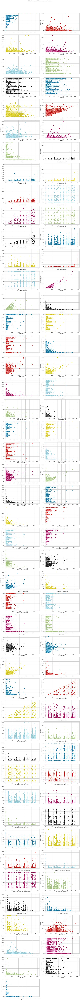

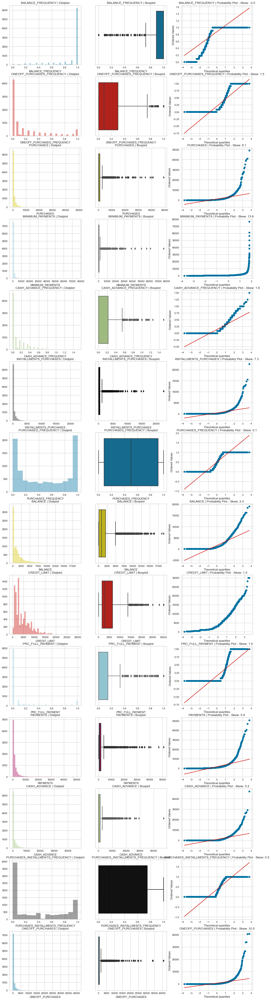

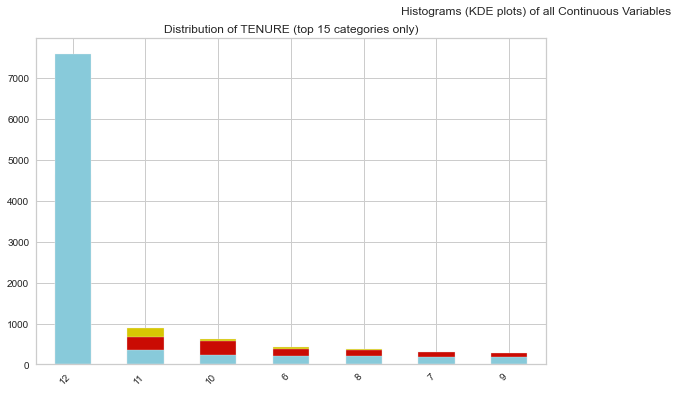

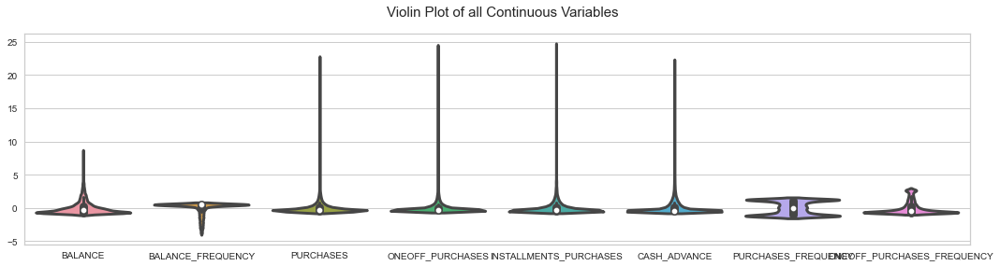

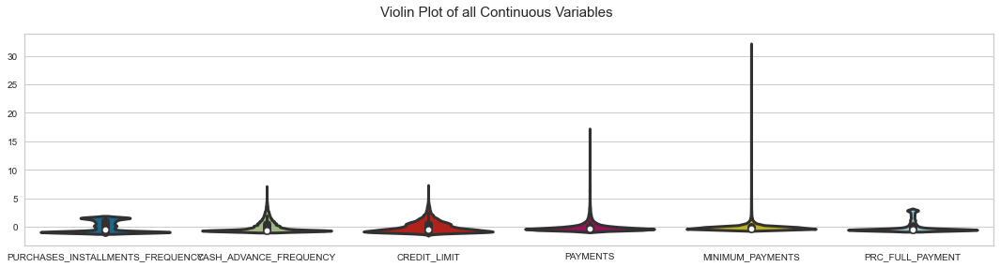

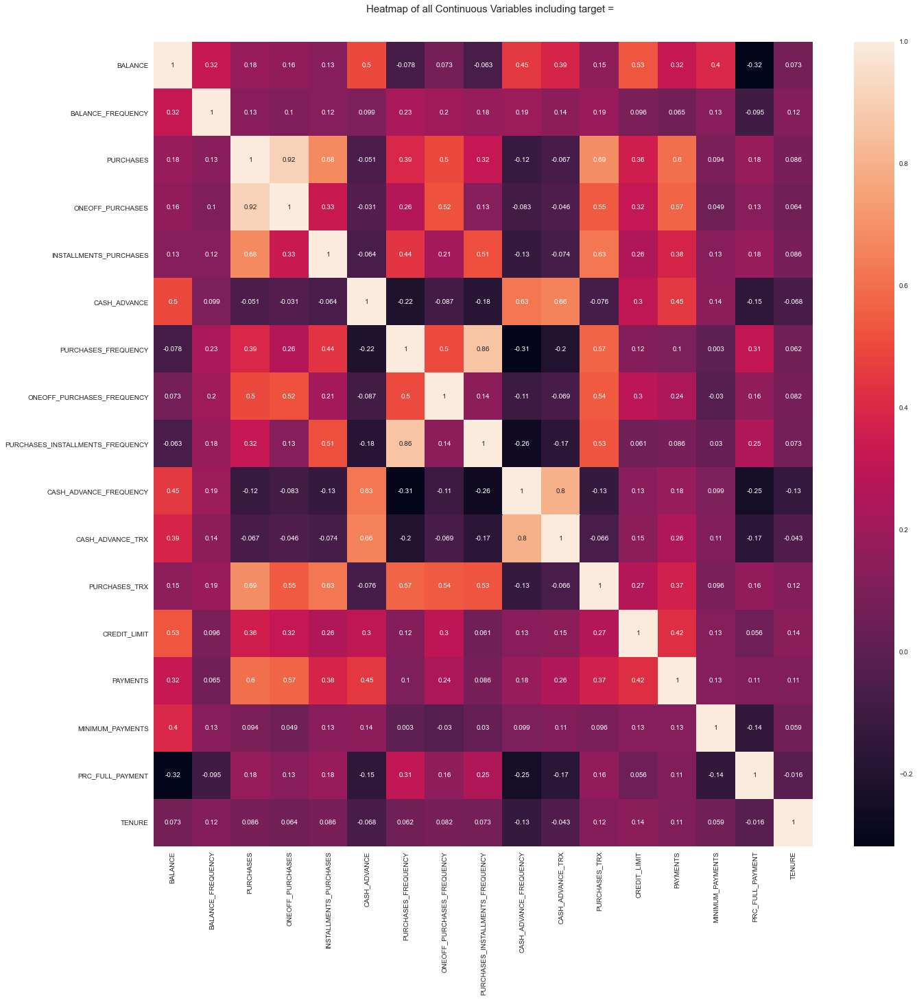

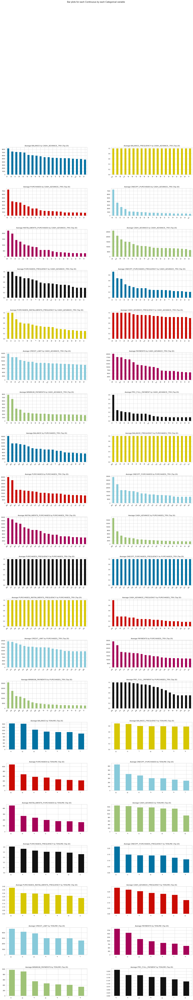

Time to run AutoViz (in seconds) = 70

 ###################### VISUALIZATION Completed ########################


In [9]:
AV = AutoViz_Class()
df = AV.AutoViz(filename="", sep=',', dfte=data, header=0, verbose=1, lowess=False, 
                chart_format='svg', )

#### by Pandas Profiling

In [ ]:
# ProfileReport(data, title="Pandas Profiling Report")

#### by 

array([[<AxesSubplot:title={'center':'BALANCE'}>,
        <AxesSubplot:title={'center':'BALANCE_FREQUENCY'}>,
        <AxesSubplot:title={'center':'PURCHASES'}>,
        <AxesSubplot:title={'center':'ONEOFF_PURCHASES'}>],
       [<AxesSubplot:title={'center':'INSTALLMENTS_PURCHASES'}>,
        <AxesSubplot:title={'center':'CASH_ADVANCE'}>,
        <AxesSubplot:title={'center':'PURCHASES_FREQUENCY'}>,
        <AxesSubplot:title={'center':'ONEOFF_PURCHASES_FREQUENCY'}>],
       [<AxesSubplot:title={'center':'PURCHASES_INSTALLMENTS_FREQUENCY'}>,
        <AxesSubplot:title={'center':'CASH_ADVANCE_FREQUENCY'}>,
        <AxesSubplot:title={'center':'CASH_ADVANCE_TRX'}>,
        <AxesSubplot:title={'center':'PURCHASES_TRX'}>],
       [<AxesSubplot:title={'center':'CREDIT_LIMIT'}>,
        <AxesSubplot:title={'center':'PAYMENTS'}>,
        <AxesSubplot:title={'center':'MINIMUM_PAYMENTS'}>,
        <AxesSubplot:title={'center':'PRC_FULL_PAYMENT'}>],
       [<AxesSubplot:title={'center':'TENURE'

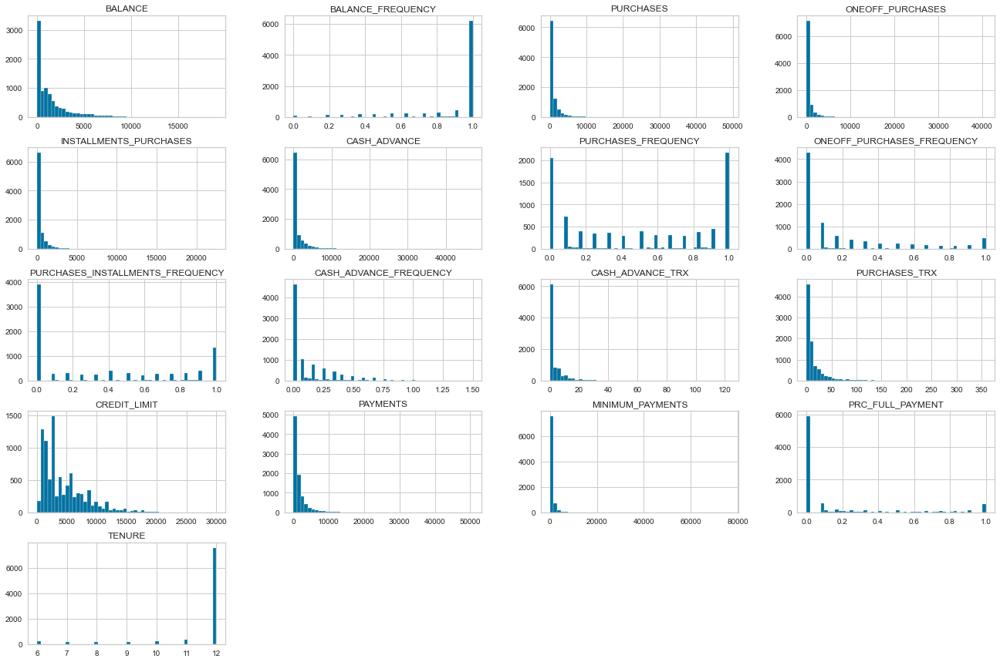

In [10]:
data.hist(bins=50,figsize=(20,15))

In [ ]:
sns.pairplot(data=data)
plt.show()

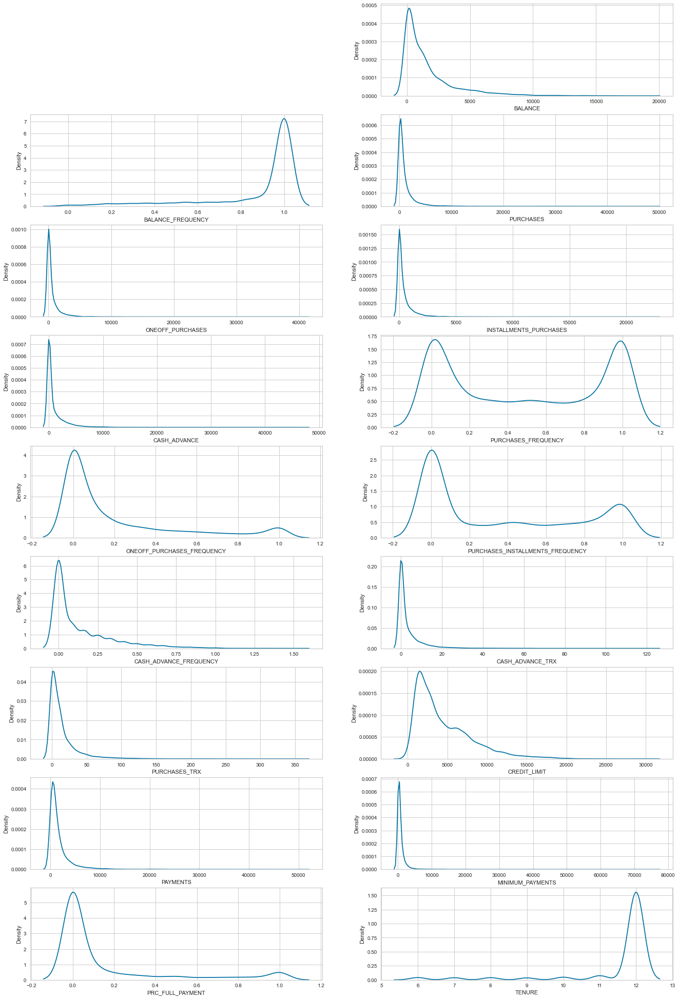

In [11]:
plt.figure(figsize=(20,35))
for i, col in enumerate(data.columns):
    if data[col].dtype != 'object':
        ax = plt.subplot(9, 2, i+1)
        sns.kdeplot(data[col], ax=ax)
        plt.xlabel(col)
plt.show()

Woah!! There is a lot of skewness and they are varied. It is kind of expected from datasets like these as there will always be a few customers who do very high amount of transactions.
I am looking for a good visualization so I would like to handle the skewness as much as possible as it will help the model to form better clusters.

In [12]:
cols = ['BALANCE', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT']

In [13]:
# for col in cols:
#     data[col] = np.log(1 + data[col])

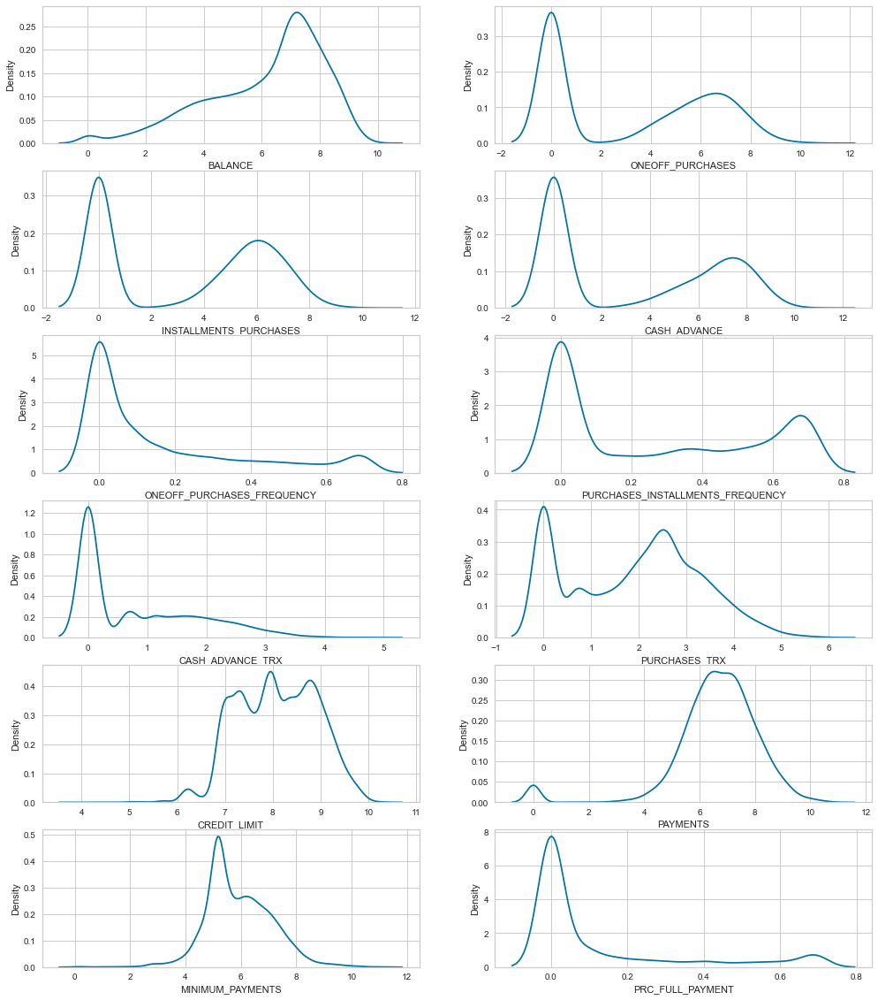

In [14]:
# plt.figure(figsize=(15,20))
# for i, col in enumerate(cols):
#     ax = plt.subplot(6, 2, i+1)
#     sns.kdeplot(data[col], ax=ax)
# plt.show()

I know it may not look like an ideal distribution but it is better than what we had and it is our job as data scientist to help our model as much as possible.



detect outliers using boxplot


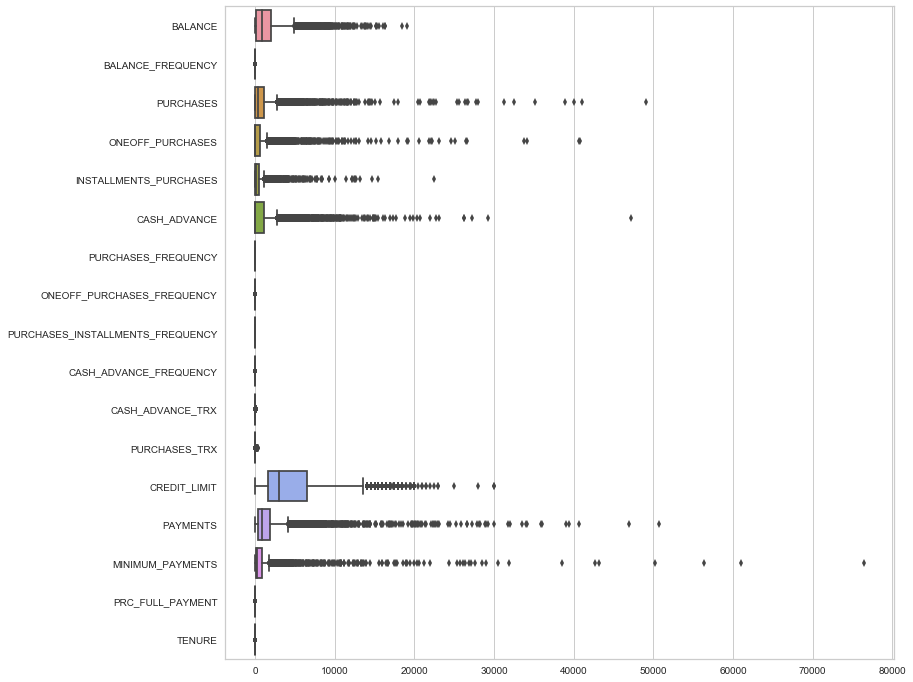

In [3]:
plt.figure(figsize=(12,12))
sns.boxplot(data=data,orient='h')
plt.show()

In [16]:
sub_data=data[['TENURE','PRC_FULL_PAYMENT','CASH_ADVANCE_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY','PURCHASES_FREQUENCY','BALANCE_FREQUENCY']]

<AxesSubplot:>

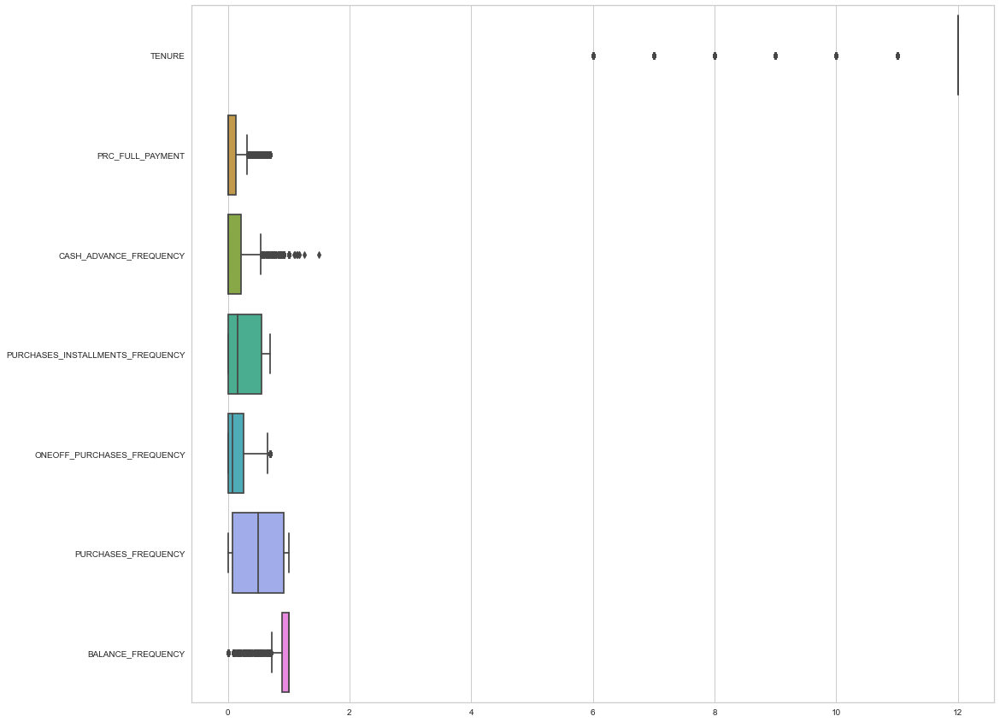

In [17]:
plt.figure(figsize=(15,15))
sns.boxplot(data=sub_data,orient='h')

In [8]:
# sns.jointplot(data= data, y='CREDIT_LIMIT' , x='PURCHASES_TRX', hue='TENURE',palette='Accent')
# plt.show()

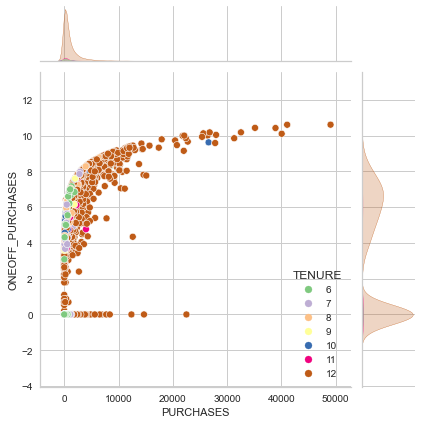

In [18]:
sns.jointplot(data= data, y='ONEOFF_PURCHASES' , x='PURCHASES', hue='TENURE',palette='Accent')
plt.show()

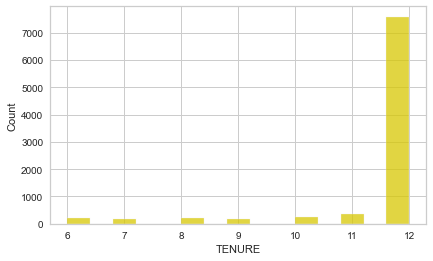

In [19]:
sns.histplot(data= data, x='TENURE',color="y")
plt.show()

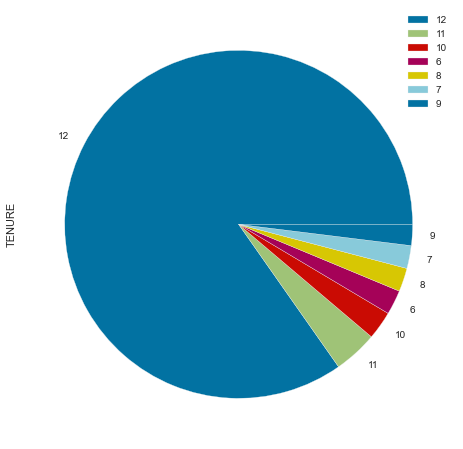

In [20]:
df_v=pd.DataFrame(data['TENURE'].value_counts())
plot = df_v.plot.pie(y='TENURE', figsize=(8, 8));

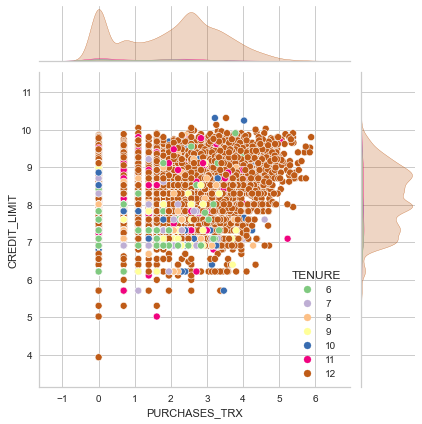

In [21]:
sns.jointplot(data= data, y='CREDIT_LIMIT' , x='PURCHASES_TRX', hue='TENURE',palette='Accent')
plt.show()

In [11]:
# sns.clustermap(data)

Looking for some correlation now.



In [22]:
data.corr()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.652592,0.171612,0.180434,-0.110924,0.521648,-0.093945,0.155496,-0.116462,0.451885,0.504146,-0.017178,0.299845,0.429075,0.816644,-0.422927,0.073873
BALANCE_FREQUENCY,0.652592,1.000000,0.133674,0.140453,0.112687,0.164510,0.229715,0.202687,0.167986,0.191873,0.193654,0.200958,0.095072,0.322262,0.474271,-0.096509,0.119776
PURCHASES,0.171612,0.133674,1.000000,0.481995,0.375059,-0.155387,0.393017,0.496939,0.313875,-0.120143,-0.137559,0.529841,0.295569,0.348400,0.130508,0.180132,0.086288
ONEOFF_PURCHASES,0.180434,0.140453,0.481995,1.000000,0.161434,-0.190146,0.373634,0.813939,0.097157,-0.116687,-0.144803,0.574393,0.284856,0.267027,0.058428,0.041784,0.091953
INSTALLMENTS_PURCHASES,-0.110924,0.112687,0.375059,0.161434,1.000000,-0.394318,0.794784,0.191380,0.905443,-0.288378,-0.335621,0.782683,0.106571,0.165432,-0.040631,0.281549,0.099394
CASH_ADVANCE,0.521648,0.164510,-0.155387,-0.190146,-0.394318,1.000000,-0.432610,-0.184706,-0.368510,0.770260,0.898398,-0.430773,0.119436,0.182519,0.413000,-0.325736,-0.100459
PURCHASES_FREQUENCY,-0.093945,0.229715,0.393017,0.373634,0.794784,-0.432610,1.000000,0.500105,0.866309,-0.308478,-0.367151,0.909024,0.112639,0.175997,-0.055643,0.312659,0.061506
ONEOFF_PURCHASES_FREQUENCY,0.155496,0.202687,0.496939,0.813939,0.191380,-0.184706,0.500105,1.000000,0.143362,-0.111085,-0.145991,0.621698,0.289817,0.274090,0.039319,0.142205,0.081559
PURCHASES_INSTALLMENTS_FREQUENCY,-0.116462,0.167986,0.313875,0.097157,0.905443,-0.368510,0.866309,0.143362,1.000000,-0.270853,-0.315215,0.769837,0.053064,0.129631,-0.041680,0.263038,0.071668
CASH_ADVANCE_FREQUENCY,0.451885,0.191873,-0.120143,-0.116687,-0.288378,0.770260,-0.308478,-0.111085,-0.270853,1.000000,0.912540,-0.302996,0.139850,0.193640,0.362634,-0.252631,-0.133372


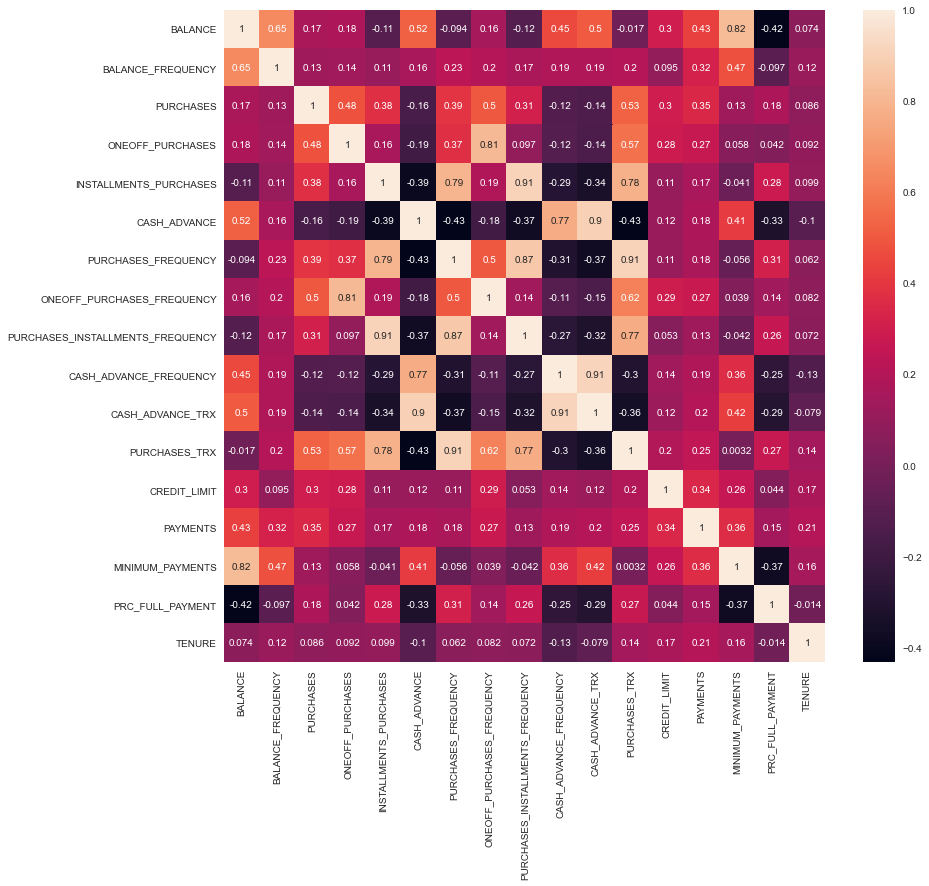

In [23]:
plt.figure(figsize=(12,12))
sns.heatmap(data.corr(), annot=True)
plt.show()

# Data Processing

Customer ID seems to be an unique id for each customer and hence won't play any role in determining the cluster.



In [5]:
data.drop(['CUST_ID'], axis=1, inplace=True)

We have seen that credit limit feature has just 0.01% of records having Nan value i.e just 1 record here has missing value. So we don't have to take the trouble to impute it. We can simply drop it and never think about it again.

In [6]:
data.dropna(subset=['CREDIT_LIMIT'], inplace=True)

For imputing minimum payments feature, I don't see any column which has relation with this feature and help us estimate values for missing records. It seems that the values are missing at random and we can simply use median to replace the Nan values as the distribution for minimum payments is skewed and hence median gives a better estimation of the central tendency of this feature.

In [7]:
data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].median(), inplace=True)
# data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].mean(), inplace=True)

In [8]:
num_col = data.select_dtypes(exclude=['object']).columns
num_col

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

Treat Outliers using IQR method

In [9]:

def removeoutliers(df=None, columns=None):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        floor, ceil = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        df[column] = df[column].clip(floor, ceil)
    return df
data_final = removeoutliers(data,num_col)

Text(0.5,1,'Numerical Features Box Plot')

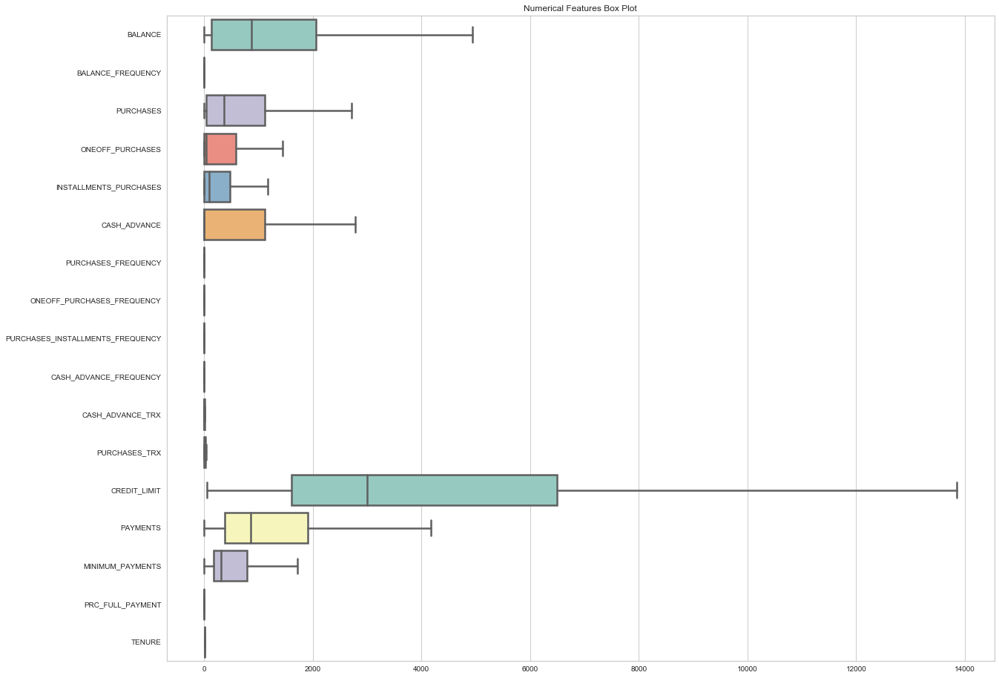

In [10]:
plt.figure(figsize = (20,16))
sns.boxplot(data = data_final[num_col], orient = 'h', palette = 'Set3', linewidth = 2.5 )
plt.title("Numerical Features Box Plot")

### Standard Scaler

In [9]:
X = data.copy()

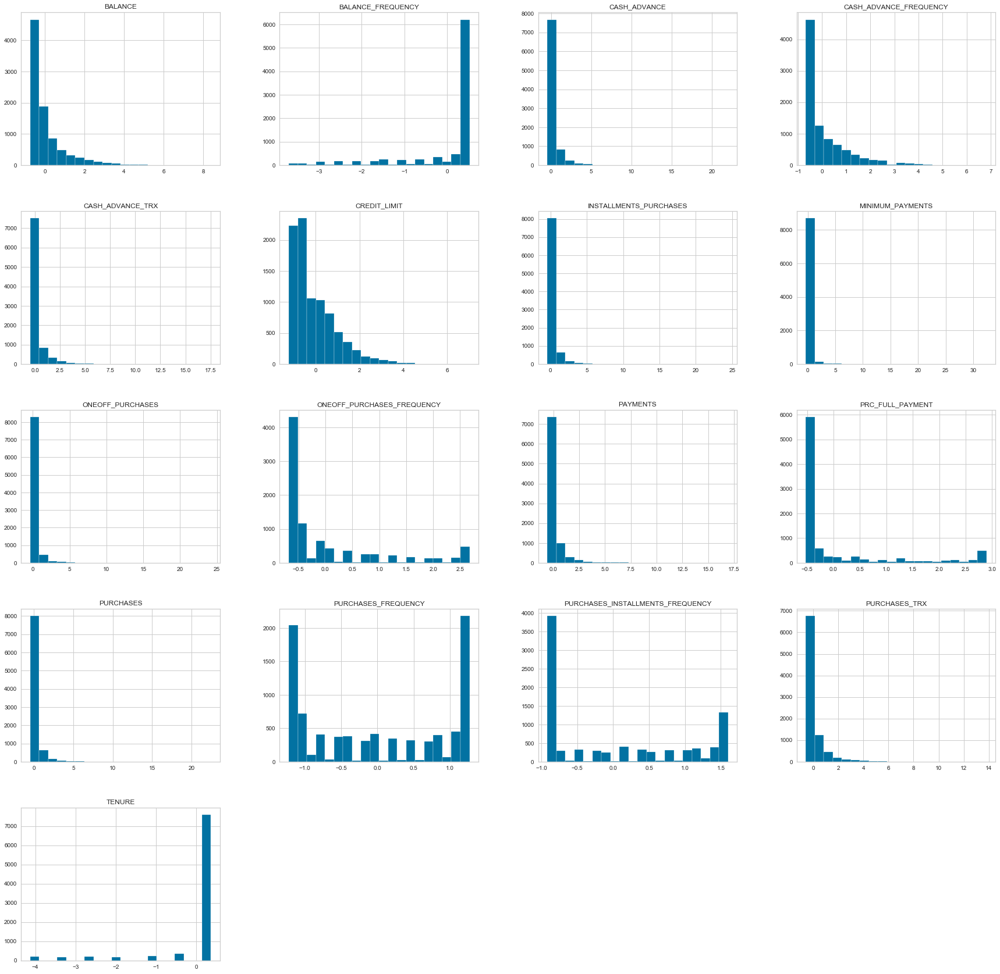

In [31]:
standard_scaler = StandardScaler()
standard_scaler.fit(data)

X[:] = standard_scaler.transform(data)

X.hist(figsize=(30, 30), bins=20)
plt.show()

### Min Max Scaler

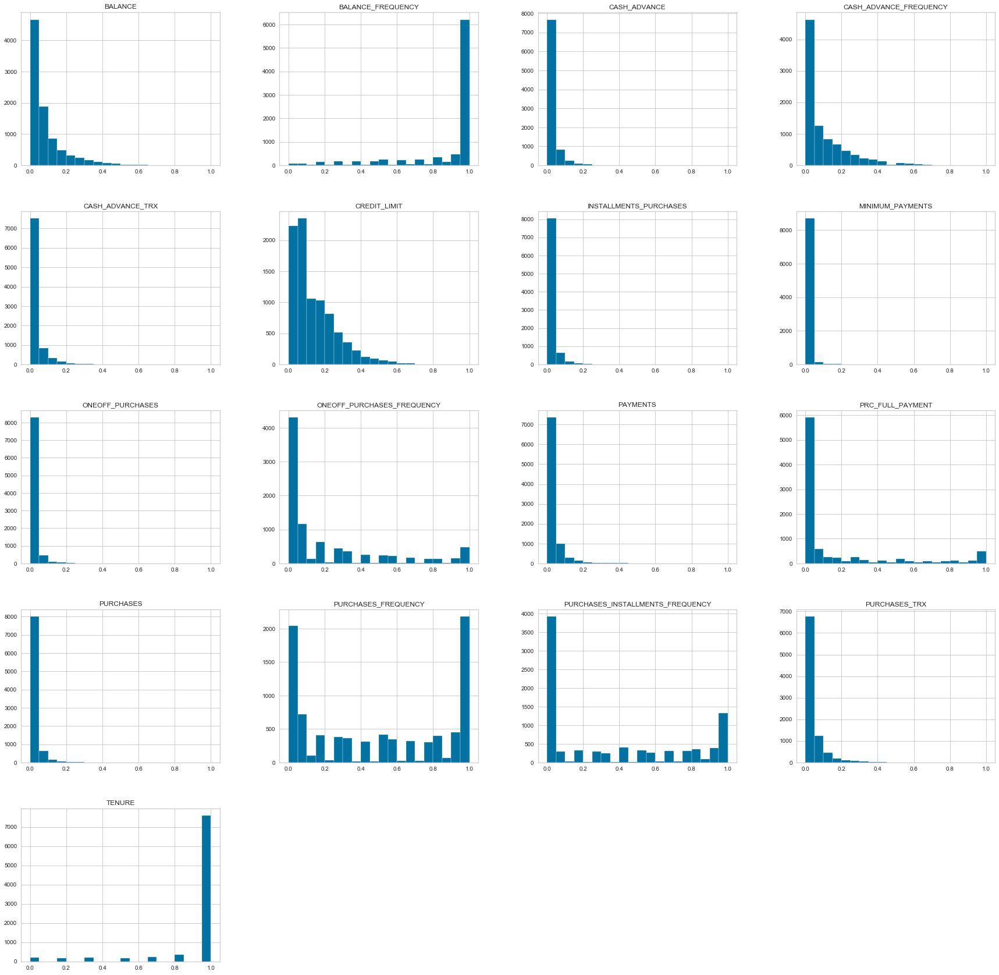

In [21]:
min_max_scaler = MinMaxScaler()
X[:] = min_max_scaler.fit_transform(X)

X.hist(figsize=(30, 30), bins=20)
plt.show()



#### Power Transformer

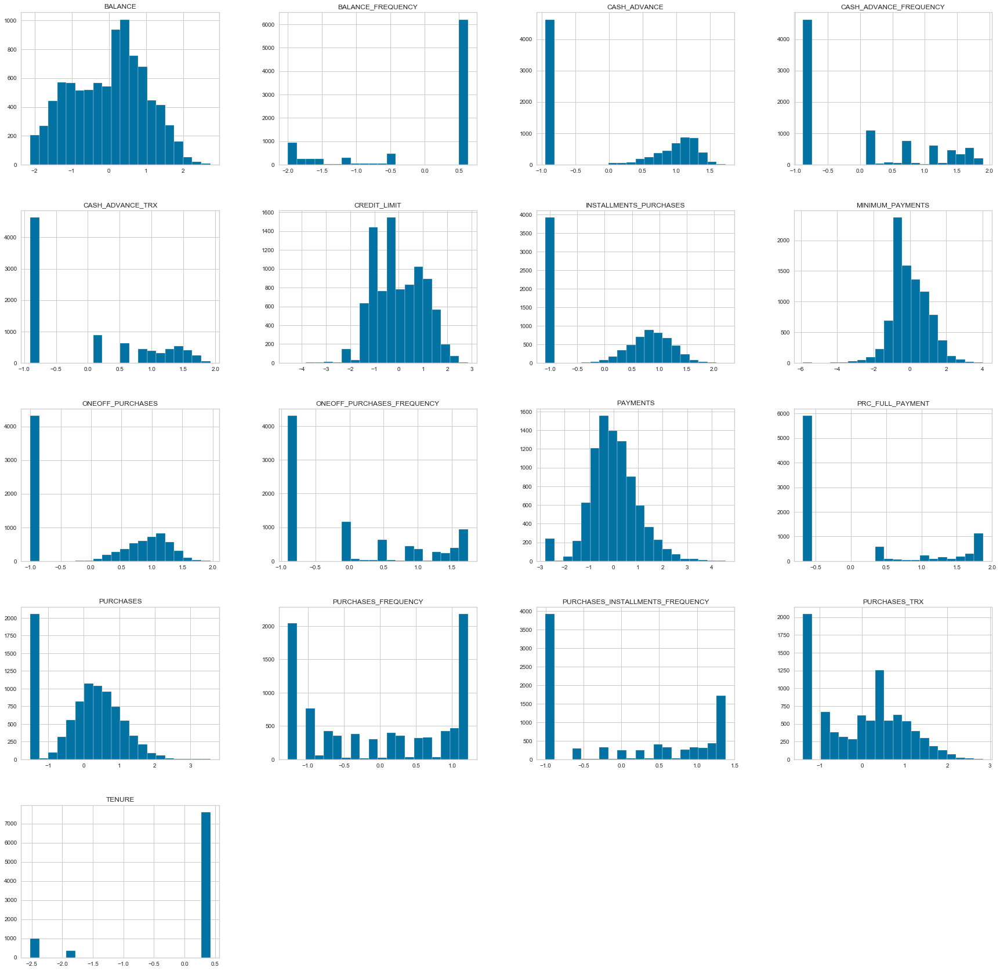

In [22]:

PowerTransformer_scaler = PowerTransformer()
X[:] = PowerTransformer_scaler.fit_transform(X)
X[:] .hist(figsize=(30, 30), bins=20)
plt.show()


choose StandardScaler to scale data

In [11]:

scalar = StandardScaler()
scaled_data = scalar.fit_transform(data_final)
data_final = pd.DataFrame(scaled_data,columns = data_final.columns)

# Evaluation Metrics


Ways to choose optimal number of clusters ->

1. Elbow Method
1. Silhouette coefficient

Elbow


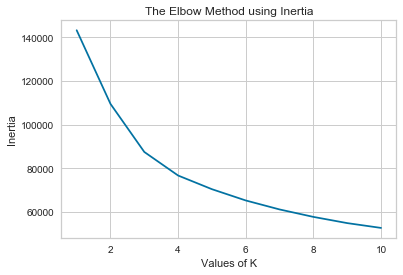

In [13]:
inertias  = []
K = range(1,11)
for k in K:
    Kmeansmodel = KMeans(n_clusters=k, random_state=12345).fit(data_final)
    inertias.append(Kmeansmodel.inertia_)
    
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

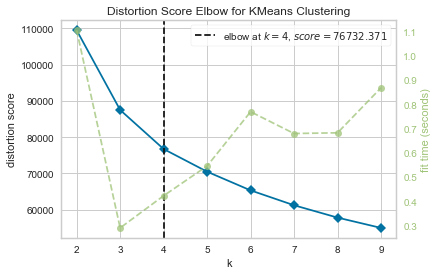

In [ ]:

# Instantiate the clustering model and visualizer
model = KMeans(init = 'k-means++')
visualizer = KElbowVisualizer(model, k=(2,10))

visualizer.fit(data_final)        # Fit the data to the visualizer
visualizer.poof()        # Finalize and render the figure

Silhouette Analysis Method



In [14]:
n_clusters = [2,3,4,5,6,7,8,9,10]
for n_cluster in n_clusters:
    kmeans = KMeans(n_clusters = n_cluster, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    cluster_labels = kmeans.fit_predict(data_final)
    silhouette_avg = silhouette_score(data_final, cluster_labels)
    print("\nFor n_clusters = ", n_cluster, "\nThe average silhouette_score is : ", silhouette_avg)
    


For n_clusters =  2 
The average silhouette_score is :  0.23289542382274778

For n_clusters =  3 
The average silhouette_score is :  0.23718303622209755

For n_clusters =  4 
The average silhouette_score is :  0.21024211925423064

For n_clusters =  5 
The average silhouette_score is :  0.2016844079642687

For n_clusters =  6 
The average silhouette_score is :  0.20417932537170685

For n_clusters =  7 
The average silhouette_score is :  0.2071935036016737

For n_clusters =  8 
The average silhouette_score is :  0.20249860526335378

For n_clusters =  9 
The average silhouette_score is :  0.20082166679436803

For n_clusters =  10 
The average silhouette_score is :  0.1987549813024428


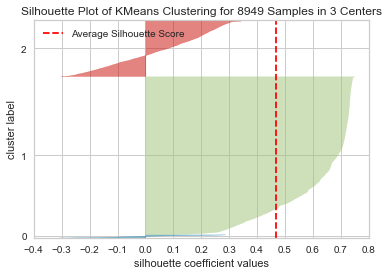

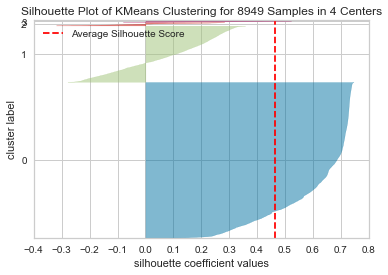

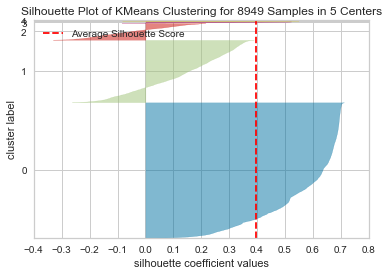

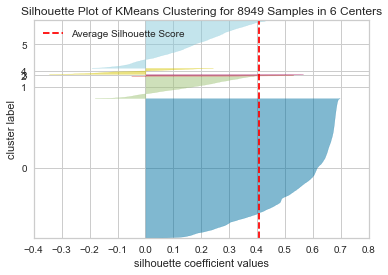

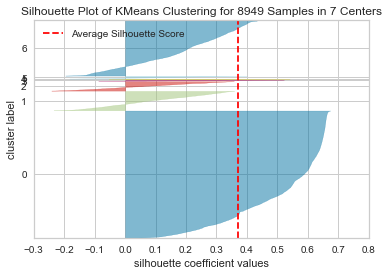

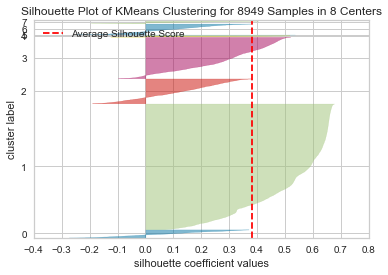

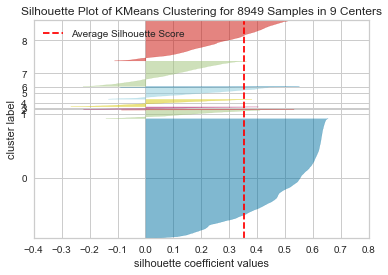

In [ ]:

# Instantiate the clustering model and visualizer
for i in range (3,10):
  model = KMeans(i, random_state=42)
  visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
  visualizer.fit(data_final)        # Fit the data to the visualizer
  visualizer.poof()        # Finalize an

As we can see, for n = 4, we obtain the highest silhouette score.
This is exactly the same number we obtained using elbow method as well as it is the number of clusters we have defined in our dataset.

# MODELING


In [42]:
labels_dict = {}

## Affinity Propagation

In [43]:
model_AffinityPropagation = AffinityPropagation(damping=0.9)
model_AffinityPropagation.fit(data_final)
labels_dict["Affinity Propagation"] = model_AffinityPropagation.labels_

## Agglomerative Clustering

In [44]:
model_AgglomerativeClustering = AgglomerativeClustering(n_clusters=4)
model_AgglomerativeClustering.fit(data_final)
labels_dict["AgglomerativeClustering"] = model_AgglomerativeClustering.labels_

## BIRCH

In [45]:
model = Birch(threshold=0.01, n_clusters=4)
# fit the model
model.fit(data_final)
labels_dict["Birch"] = model.labels_

## DBSCAN

In [46]:
model = DBSCAN(eps=0.30, min_samples=9)
model.fit(data_final)
labels_dict["DBSCAN"] = model.labels_

## K-Means

In [47]:
model_KMeans = KMeans(n_clusters=4)
# fit the model
model_KMeans.fit(data_final)
labels_dict["KMeans"] = model_KMeans.labels_

## Mini-Batch K-Means

In [48]:
model = MiniBatchKMeans(n_clusters=4)
# fit the model
model.fit(data_final)
labels_dict["MiniBatchKMeans"] = model.labels_

## OPTICS

In [49]:
model = OPTICS(eps=0.8, min_samples=10)
model.fit(data_final)
labels_dict["OPTICS"] = model.labels_

## Spectral Clustering

In [53]:
model = SpectralClustering(n_clusters=4)
model.fit(data_final)
labels_dict["SpectralClustering"] = model.labels_

### Evaluating the models

In [54]:
for keys, values in labels_dict.items():
    print("Clustering Algorithm: ", keys)
    ss = silhouette_score(data_final,labels = values,metric = 'euclidean')
    print("Silhouette Score: ", np.round(ss, decimals=3))

Clustering Algorithm:  Affinity Propagation
Silhouette Score:  0.139
Clustering Algorithm:  AgglomerativeClustering
Silhouette Score:  0.172
Clustering Algorithm:  Birch
Silhouette Score:  0.172
Clustering Algorithm:  DBSCAN
Silhouette Score:  -0.339
Clustering Algorithm:  KMeans
Silhouette Score:  0.21
Clustering Algorithm:  MiniBatchKMeans
Silhouette Score:  0.211
Clustering Algorithm:  OPTICS
Silhouette Score:  -0.487
Clustering Algorithm:  SpectralClustering
Silhouette Score:  0.193


KMeans and MiniBatchKMeans the best

# Visualization of Clusters using PCA

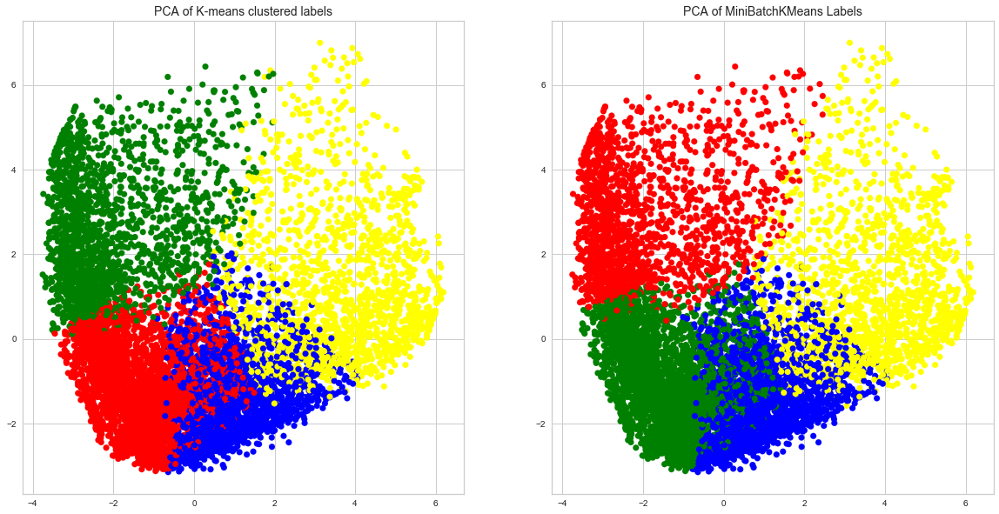

In [61]:
pca_2d = PCA(n_components=2).fit_transform(data_final)
fig = plt.figure(figsize=(20,10))
ax1, ax2 = fig.subplots(1, 2)

##1 pricipal components using Kmeans Clustering
label_color_dict = {0:'red',1:'green',2:'blue',3:'yellow'}
cvec = [label_color_dict[label] for label in labels_dict["KMeans"]]
ax1.scatter(x=pca_2d[:, 0], y=pca_2d[:, 1], color=cvec,lw=0.1)
ax1.set_title('PCA of K-means clustered labels',fontsize = 14)

##2 pricipal components using MiniBatchKMeans Complete Clustering
label_color_dict = {0:'red',1:'green',2:'blue',3:'yellow'}
cvec = [label_color_dict[label] for label in labels_dict["MiniBatchKMeans"]]
ax2.scatter(x=pca_2d[:, 0], y=pca_2d[:, 1], color=cvec,lw=0.1)
ax2.set_title('PCA of MiniBatchKMeans Labels',fontsize = 14)

fig.savefig('CreditCard.png')

clustring by 2d

1. Corelation observed between CREDIT_LIMIT-BALANCE



In [11]:
X = data.iloc[:,[12,0]]
X.head()

,CREDIT_LIMIT,BALANCE
0,1000.0,40.900749
1,7000.0,3202.467416
2,7500.0,2495.148862
3,7500.0,1666.670542
4,1200.0,817.714335


In [13]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)
X = X.values

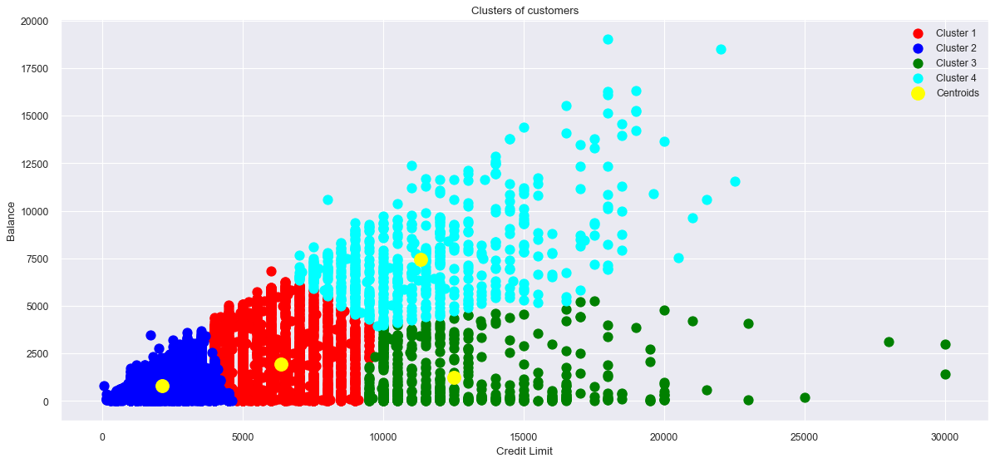

In [14]:
plt.figure(figsize=(18, 8), dpi=80)
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 200, c = 'yellow', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('Credit Limit')
plt.ylabel('Balance')
plt.legend()
plt.show()

2. Corelation observed between PURCHASES-PAYMENTS

In [15]:
X = data.iloc[:,[2,13]]
X.head()

,PURCHASES,PAYMENTS
0,95.40,201.802084
1,0.00,4103.032597
2,773.17,622.066742
3,1499.00,0.000000
4,16.00,678.334763


In [17]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)
X = X.values

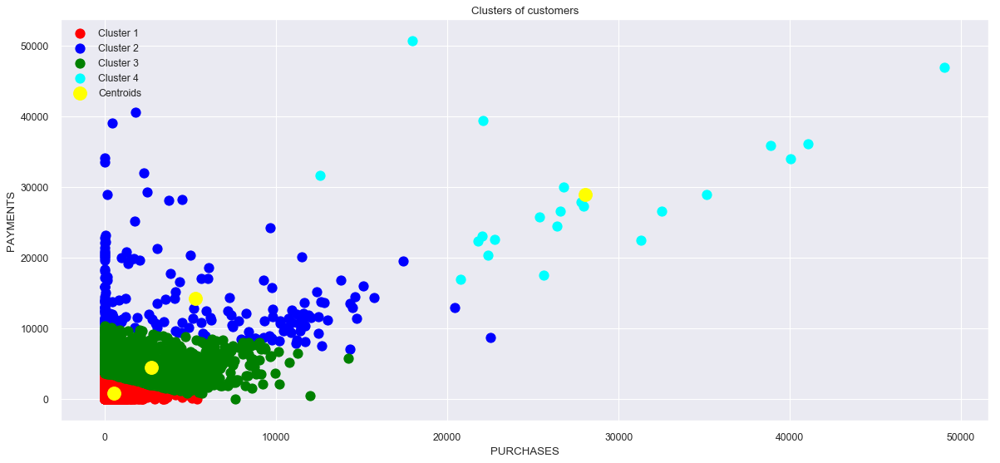

In [18]:
plt.figure(figsize=(18, 8), dpi=80)
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 200, c = 'yellow', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('PURCHASES')
plt.ylabel('PAYMENTS')
plt.legend()
plt.show()

Lets try to visualise using two variables like BALANCE and PURCHASES:



In [19]:
# X = data[['BALANCE','PURCHASES']]
X = data.iloc[:,[0,2]]
X.head()

,BALANCE,PURCHASES
0,40.900749,95.40
1,3202.467416,0.00
2,2495.148862,773.17
3,1666.670542,1499.00
4,817.714335,16.00


In [21]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)
X = X.values

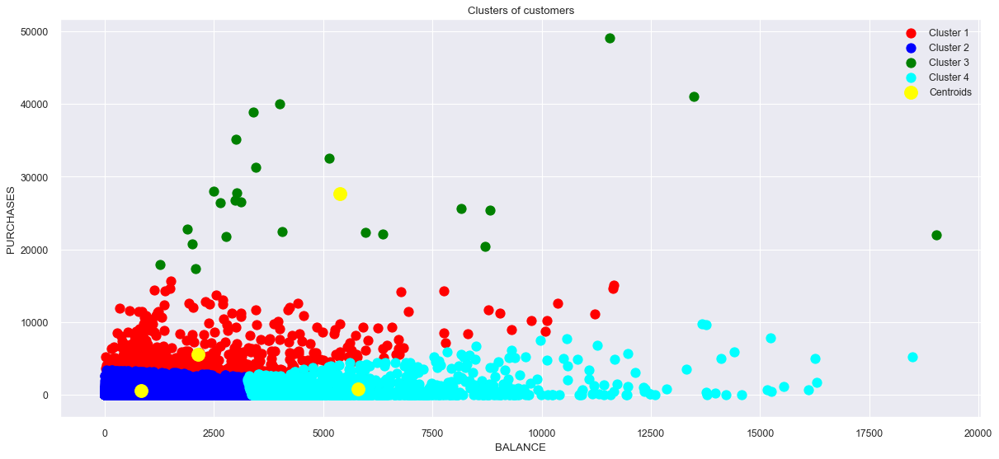

In [22]:
plt.figure(figsize=(18, 8), dpi=80)
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 200, c = 'yellow', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.legend()
plt.show()

## pycaret

In [15]:
clu1 = setup(data, session_id=123, log_experiment=True, log_plots = True, 
             experiment_name='health1')

,Description,Value
0,session_id,123
1,Original Data,"(8949, 17)"
2,Missing Values,False
3,Numeric Features,16
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(8949, 23)"
9,CPU Jobs,-1


2022/08/24 22:17:45 INFO mlflow.tracking.fluent: Experiment with name 'health1' does not exist. Creating a new experiment.


In [16]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [17]:
kmeans = create_model('kmeans', num_clusters = 4)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4645,2687.4524,1.0932,0,0,0


In [18]:
kmeans_results = assign_model(kmeans)
kmeans_results.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,Cluster 1
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,Cluster 2
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,Cluster 2
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.304943,0.000000,12,Cluster 2
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,Cluster 1


In [19]:
plot_model(kmeans)


In [20]:
plot_model(kmeans, plot = 'tsne')

In [21]:
# plot_model(kmeans, plot = 'elbow')

In [22]:
# plot_model(kmeans, plot = 'silhouette')

In [23]:
plot_model(kmeans, plot = 'distribution') #to see size of clusters


In [24]:
plot_model(kmeans, plot = 'distribution', feature = 'TENURE')

Hierarchical Clustering
Hierarchical clustering is a method of cluster analysis that attempts to create a hierarchy of clusters. Hierarchical clustering strategies are generally divided into two types:

Agglomerative: This is a "bottom-up" approach: each observation starts in its own cluster, and pairs of clusters are merged as one moves up the hierarchy.
Divisive: This is a "top-down" approach: all observations start in one cluster, and splits are performed recursively as one moves down the hierarchy.

In [25]:
hierarchical_clust = create_model('hclust')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3815,2215.7618,1.4904,0,0,0


In [26]:
hierarchical_results = assign_model(hierarchical_clust)
hierarchical_results.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,Cluster 3
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,Cluster 0
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,Cluster 0
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.304943,0.000000,12,Cluster 0
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,Cluster 3


In [27]:
plot_model(hierarchical_clust)

In [28]:
plot_model(hierarchical_clust, plot = 'distribution') #to see size of clusters

In [29]:
plot_model(hierarchical_clust, plot ='tsne')